In [2]:
#!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cpu
!pip install shap
!pip install branca
!pip install folium
!pip install matplotlib
!pip install mapclassify
#

ERROR: Could not install packages due to an OSError: Could not find a suitable TLS CA certificate bundle, invalid path: C:\Program Files\PostgreSQL\18\ssl\certs\ca-bundle.crt



In [1]:
import geopandas as gpd

final_data=gpd.read_file('D:/3A ENSAE/Machine Learning for climate risk/Project/Clean_Bases/final_data_20_24.gpkg')

final_data.head(3)

,SWI_UNIF_MENS,ym,swi_min,swi_mean,swi_max,prenei_sum,preliq_sum,pe_sum,evap_sum,t_avg,...,nom_officiel_en_majuscules,numero_du_canton,code_insee,codes_insee_des_arrondissements,code_insee_du_departement,code_insee_de_la_region,composition_du_canton,dept_name,region_name,geometry
0,0.949,2020-01,0.861,0.90229,0.956,0.0,48.2,29.5,18.7,7.225806,...,DUNKERQUE-2,17,5917,594,59,32,Fraction d'une commune et de commune(s) entièr...,Nord,Hauts-de-France,POINT (665362 7106108)
1,0.957,2020-01,0.858,0.90429,0.956,0.0,45.3,24.5,20.8,7.319355,...,MARCK,34,6234,626,62,32,Commune(s) entière(s),Pas-de-Calais,Hauts-de-France,POINT (625315 7098447)
2,0.957,2020-01,0.857,0.90400,0.956,0.0,45.3,24.8,20.5,7.319355,...,MARCK,34,6234,626,62,32,Commune(s) entière(s),Pas-de-Calais,Hauts-de-France,POINT (633311 7098380)


In [2]:
final_data.columns

Index(['SWI_UNIF_MENS', 'ym', 'swi_min', 'swi_mean', 'swi_max', 'prenei_sum',
       'preliq_sum', 'pe_sum', 'evap_sum', 't_avg', 'ff_avg', 'q_avg',
       'hu_avg', 'dli_avg', 'ssi_avg', 'etp_avg', 'tinf_avg', 'tsup_avg',
       'resr_neige_avg', 'resr_neige6_avg', 'hteurneige_avg',
       'hteurneige6_avg', 'hteurneigex_avg', 'snow_frac_avg', 'drainc_sum',
       'runc_sum', 'ecoulement_sum', 'wg_racine_avg', 'wgi_racine_avg', 'ALEA',
       'NIVEAU', 'index__adm', 'cleabs', 'nom_officiel',
       'nom_officiel_en_majuscules', 'numero_du_canton', 'code_insee',
       'codes_insee_des_arrondissements', 'code_insee_du_departement',
       'code_insee_de_la_region', 'composition_du_canton', 'dept_name',
       'region_name', 'geometry'],
      dtype='object')

In [3]:
import random
import numpy as np
import torch

SEED = 42  # you can pick any number

# Python random
random.seed(SEED)

# NumPy
np.random.seed(SEED)

# PyTorch
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)  # if multiple GPUs

# Optional: deterministic behavior
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False


In [4]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder
import numpy as np

# Variables dynamiques
dyn_vars = ['swi_min','swi_mean','swi_max','prenei_sum','preliq_sum','pe_sum',
            'evap_sum','t_avg','ff_avg','q_avg','hu_avg','dli_avg','ssi_avg',
            'etp_avg','tinf_avg','tsup_avg','resr_neige_avg','resr_neige6_avg',
            'hteurneige_avg','hteurneige6_avg','hteurneigex_avg','snow_frac_avg',
            'drainc_sum','runc_sum','ecoulement_sum','wg_racine_avg','wgi_racine_avg']

X_dyn = final_data[dyn_vars].values
scaler_dyn = StandardScaler()
X_dyn_scaled = scaler_dyn.fit_transform(X_dyn)

# Variables statiques
X_stat_num = final_data[['NIVEAU']].values
scaler_stat = StandardScaler()
X_stat_num_scaled = scaler_stat.fit_transform(X_stat_num)

X_stat_cat = final_data[['region_name']]
ohe = OneHotEncoder(sparse_output=False, handle_unknown='ignore')
X_stat_cat_enc = ohe.fit_transform(X_stat_cat)

X_stat_final = np.hstack([X_stat_num_scaled, X_stat_cat_enc])

# Cible
y = final_data['SWI_UNIF_MENS'].values


Créer un dataset pytorch

In [5]:
import torch
from torch.utils.data import Dataset, DataLoader

class SWIDataset(Dataset):
    def __init__(self, X_dyn, X_stat, y):
        self.X_dyn = torch.tensor(X_dyn, dtype=torch.float32)
        self.X_stat = torch.tensor(X_stat, dtype=torch.float32)
        self.y = torch.tensor(y, dtype=torch.float32).unsqueeze(1)

    def __len__(self):
        return len(self.y)

    def __getitem__(self, idx):
        return self.X_dyn[idx], self.X_stat[idx], self.y[idx]


Construire le MPL à deux entrées

In [6]:
import torch.nn as nn

class MLP(nn.Module):
    def __init__(self, N_dyn, N_stat):
        super().__init__()
        # Branche dynamique
        self.dyn_branch = nn.Sequential(
            nn.Linear(N_dyn, 64),
            nn.ReLU(),
            nn.Linear(64, 32),
            nn.ReLU()
        )
        # Branche statique
        self.stat_branch = nn.Sequential(
            nn.Linear(N_stat, 16),
            nn.ReLU()
        )
        # Fusion et sortie
        self.fusion = nn.Sequential(
            nn.Linear(32 + 16, 32),
            nn.ReLU(),
            nn.Linear(32, 1)  # sortie continue
        )

    def forward(self, X_dyn, X_stat):
        out_dyn = self.dyn_branch(X_dyn)
        out_stat = self.stat_branch(X_stat)
        out = torch.cat([out_dyn, out_stat], dim=1)
        return self.fusion(out)


Préparer les dataloaders

In [7]:
# Masques train/test avec la variable ym
train_mask = final_data['ym'] < '2024-01'
test_mask = final_data['ym'] >= '2024-01'

X_dyn_train = X_dyn_scaled[train_mask]
X_stat_train = X_stat_final[train_mask]
y_train = y[train_mask]

X_dyn_test = X_dyn_scaled[test_mask]
X_stat_test = X_stat_final[test_mask]
y_test = y[test_mask]

train_dataset = SWIDataset(X_dyn_train, X_stat_train, y_train)
test_dataset = SWIDataset(X_dyn_test, X_stat_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)


In [8]:
import torch.optim as optim

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = MLP(N_dyn=X_dyn_train.shape[1], N_stat=X_stat_train.shape[1]).to(device)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)

n_epochs = 50
for epoch in range(n_epochs):
    model.train()
    epoch_loss = 0
    for X_dyn_batch, X_stat_batch, y_batch in train_loader:
        X_dyn_batch, X_stat_batch, y_batch = X_dyn_batch.to(device), X_stat_batch.to(device), y_batch.to(device)
        optimizer.zero_grad()
        y_pred = model(X_dyn_batch, X_stat_batch)
        loss = criterion(y_pred, y_batch)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item() * X_dyn_batch.size(0)
    epoch_loss /= len(train_loader.dataset)
    print(f"Epoch {epoch+1}/{n_epochs} - Loss: {epoch_loss:.4f}")


Epoch 1/50 - Loss: 0.0037
Epoch 2/50 - Loss: 0.0018
Epoch 3/50 - Loss: 0.0016
Epoch 4/50 - Loss: 0.0015
Epoch 5/50 - Loss: 0.0014
Epoch 6/50 - Loss: 0.0013
Epoch 7/50 - Loss: 0.0013
Epoch 8/50 - Loss: 0.0013
Epoch 9/50 - Loss: 0.0012
Epoch 10/50 - Loss: 0.0012
Epoch 11/50 - Loss: 0.0012
Epoch 12/50 - Loss: 0.0012
Epoch 13/50 - Loss: 0.0011
Epoch 14/50 - Loss: 0.0011
Epoch 15/50 - Loss: 0.0011
Epoch 16/50 - Loss: 0.0011
Epoch 17/50 - Loss: 0.0011
Epoch 18/50 - Loss: 0.0011
Epoch 19/50 - Loss: 0.0011
Epoch 20/50 - Loss: 0.0011
Epoch 21/50 - Loss: 0.0010
Epoch 22/50 - Loss: 0.0010
Epoch 23/50 - Loss: 0.0010
Epoch 24/50 - Loss: 0.0010
Epoch 25/50 - Loss: 0.0010
Epoch 26/50 - Loss: 0.0010
Epoch 27/50 - Loss: 0.0010
Epoch 28/50 - Loss: 0.0010
Epoch 29/50 - Loss: 0.0010
Epoch 30/50 - Loss: 0.0010
Epoch 31/50 - Loss: 0.0010
Epoch 32/50 - Loss: 0.0010
Epoch 33/50 - Loss: 0.0010
Epoch 34/50 - Loss: 0.0010
Epoch 35/50 - Loss: 0.0010
Epoch 36/50 - Loss: 0.0010
Epoch 37/50 - Loss: 0.0010
Epoch 38/5

Evaluer la performance sur les données tests

In [9]:
model.eval()
with torch.no_grad():
    X_dyn_test_t = torch.tensor(X_dyn_test, dtype=torch.float32).to(device)
    X_stat_test_t = torch.tensor(X_stat_test, dtype=torch.float32).to(device)
    y_test_t = torch.tensor(y_test, dtype=torch.float32).unsqueeze(1).to(device)

    y_pred_test = model(X_dyn_test_t, X_stat_test_t)
    mse_test = nn.MSELoss()(y_pred_test, y_test_t).item()
    rmse_test = mse_test ** 0.5
    print(f"Test RMSE: {rmse_test:.4f}")


Test RMSE: 0.0546


In [14]:
class MLPForSHAP(torch.nn.Module):
    def __init__(self, model, n_dyn):
        super().__init__()
        self.model = model
        self.n_dyn = n_dyn

    def forward(self, X):
        X_dyn = X[:, :self.n_dyn]
        X_stat = X[:, self.n_dyn:]
        return self.model(X_dyn, X_stat)


In [15]:
model.eval()

N_DYN = X_dyn_train.shape[1]

X_ref = torch.tensor(
    np.hstack([X_dyn_train, X_stat_train]),
    dtype=torch.float32
).to(device)

X_test = torch.tensor(
    np.hstack([X_dyn_test, X_stat_test]),
    dtype=torch.float32
).to(device)


In [16]:
import shap

shap_model = MLPForSHAP(model, N_DYN).to(device)

explainer = shap.GradientExplainer(
    shap_model,
    X_ref
)

shap_values = explainer.shap_values(X_test)


/opt/python/lib/python3.13/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [17]:
shap_values = shap_values.squeeze(-1)


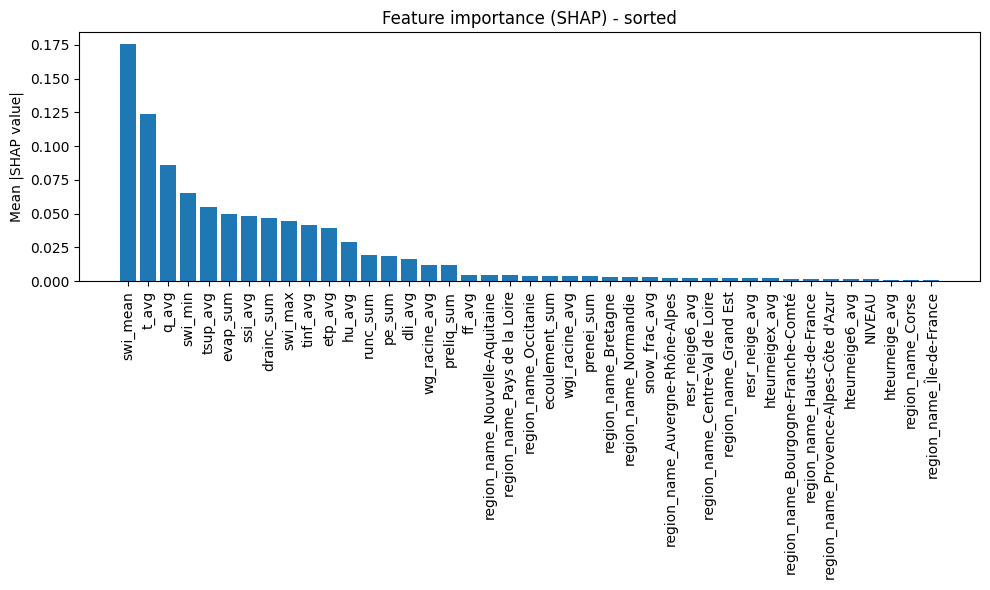

In [19]:
import numpy as np
import matplotlib.pyplot as plt

feature_names = (
    dyn_vars
    + ['NIVEAU']
    + list(ohe.get_feature_names_out(['region_name']))
)


# Valeurs SHAP déjà corrigées
shap_abs_mean = np.mean(np.abs(shap_values), axis=0)

# Indices pour tri décroissant
sorted_idx = np.argsort(shap_abs_mean)[::-1]  # du plus important au moins important

# Features et valeurs triées
sorted_features = np.array(feature_names)[sorted_idx]
sorted_shap = shap_abs_mean[sorted_idx]

# Plot vertical trié
plt.figure(figsize=(10, 6))
plt.bar(sorted_features, sorted_shap)
plt.xticks(rotation=90)
plt.ylabel("Mean |SHAP value|")
plt.title("Feature importance (SHAP) - sorted")
plt.tight_layout()
plt.show()


/tmp/ipykernel_1690/280668572.py:1: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(


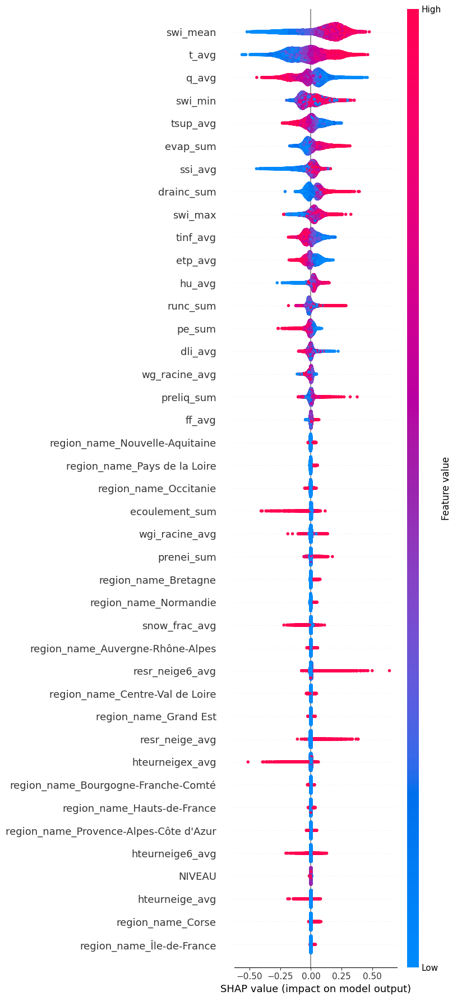

In [20]:
shap.summary_plot(
    shap_values,
    X_test.cpu().numpy(),
    feature_names=feature_names,
    plot_type="dot",
    max_display=50
)


In [10]:
import geopandas as gpd
import pandas as pd
import numpy as np

# Filter 2024 data
gdf_2024 = gpd.GeoDataFrame(final_data[final_data['ym'].str.startswith('2024')].copy())

# Prepare features (dynamic + static) for the model
X_dyn_2024 = X_dyn_test  # or whatever you used for 2024 dynamic variables
X_stat_2024 = X_stat_test  # static variables for these rows

# Make predictions with your trained model
import torch

model.eval()
with torch.no_grad():
    X_dyn_t = torch.tensor(X_dyn_2024, dtype=torch.float32).to(device)
    X_stat_t = torch.tensor(X_stat_2024, dtype=torch.float32).to(device)
    y_pred_2024 = model(X_dyn_t, X_stat_t).cpu().numpy().flatten()  # flatten to 1D

# Add predictions and errors to the GeoDataFrame
gdf_2024['y_pred'] = y_pred_2024
gdf_2024['error'] = np.abs(gdf_2024['y_pred'] - gdf_2024['SWI_UNIF_MENS'])


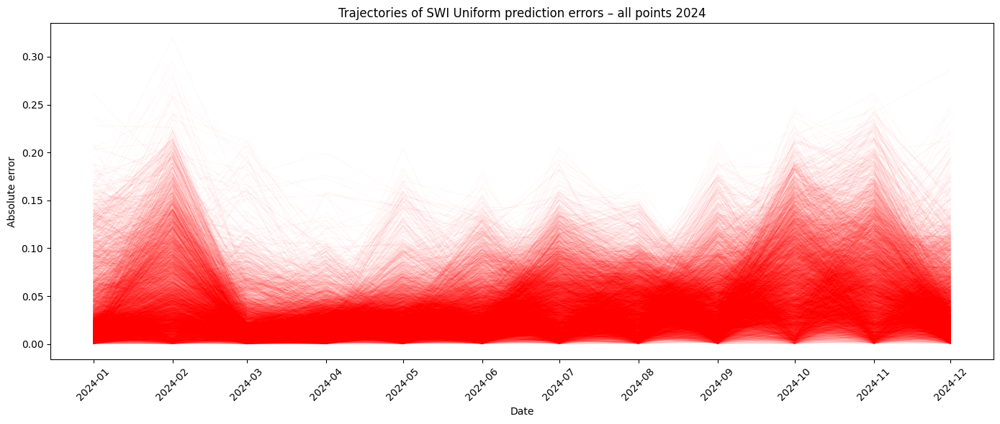

In [11]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd

# Filtrer uniquement 2024
df_2024 = final_data[final_data['ym'].str.startswith('2024')].copy()


import torch
import numpy as np

# Filtrer 2024
df_2024 = final_data[final_data['ym'].str.startswith('2024')].copy()

# Préparer les features pour le modèle
# X_dyn_2024 et X_stat_2024 doivent correspondre aux colonnes utilisées pour le modèle
X_dyn_2024 = X_dyn_test  # ou reconstruire dynamiques depuis df_2024
X_stat_2024 = X_stat_test  # idem pour statiques

# Prédictions
model.eval()
with torch.no_grad():
    X_dyn_t = torch.tensor(X_dyn_2024, dtype=torch.float32).to(device)
    X_stat_t = torch.tensor(X_stat_2024, dtype=torch.float32).to(device)
    y_pred_2024 = model(X_dyn_t, X_stat_t).cpu().numpy().flatten()

# Ajouter y_pred et erreur
df_2024['y_pred'] = y_pred_2024
df_2024['error'] = np.abs(df_2024['y_pred'] - df_2024['SWI_UNIF_MENS'])

# Conversion de la colonne ym en datetime
df_2024['ym_dt'] = pd.to_datetime(df_2024['ym'], format="%Y-%m")

fig, ax = plt.subplots(figsize=(14, 6))

# Trajectoire des erreurs pour chaque point géométrique
for _, g in df_2024.groupby("geometry"):
    ax.plot(
        g["ym_dt"],
        np.abs(g["y_pred"] - g["SWI_UNIF_MENS"]),  # trace l'erreur
        linewidth=0.5,
        alpha=0.05,  # transparence pour visualiser la densité
        color='red'
    )

# Tous les mois visibles
ax.xaxis.set_major_locator(mdates.MonthLocator())  # tous les mois
ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m"))

ax.set_xlabel("Date")
ax.set_ylabel("Absolute error")
ax.set_title("Trajectories of SWI Uniform prediction errors – all points 2024")

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [12]:
import torch
import numpy as np
import pandas as pd
import geopandas as gpd

# Filtrer 2024
df_2024 = final_data[final_data['ym'].str.startswith('2024')].copy()

# Préparer tes features dynamiques et statiques comme pour le test
# Exemple :
# X_dyn_2024 = df_2024[dyn_vars].values
# X_stat_2024 = df_2024[stat_vars].values
X_dyn_2024 = X_dyn_test  # remplacer par la vraie extraction depuis df_2024
X_stat_2024 = X_stat_test  # idem

# Prédiction avec le modèle
model.eval()
with torch.no_grad():
    X_dyn_t = torch.tensor(X_dyn_2024, dtype=torch.float32).to(device)
    X_stat_t = torch.tensor(X_stat_2024, dtype=torch.float32).to(device)
    y_pred_2024 = model(X_dyn_t, X_stat_t).cpu().numpy().flatten()

# Ajouter y_pred et erreur
df_2024['y_pred'] = y_pred_2024
df_2024['error'] = np.abs(df_2024['y_pred'] - df_2024['SWI_UNIF_MENS'])

# Ajouter trimestre
def assign_quarter(ym):
    month = int(ym.split('-')[1])
    if month <= 3:
        return 'T1'
    elif month <= 6:
        return 'T2'
    elif month <= 9:
        return 'T3'
    else:
        return 'T4'

df_2024['quarter'] = df_2024['ym'].apply(assign_quarter)

# Agréger par geometry et trimestre
gdf_quarter = df_2024.groupby(['geometry','region_name','quarter']).agg(
    error_mean=('error', 'mean')
).reset_index()

# Transformer en GeoDataFrame
gdf_quarter = gpd.GeoDataFrame(gdf_quarter, geometry='geometry')


In [13]:
# T1
gdf_T1 = gdf_quarter[gdf_quarter['quarter'] == 'T1']
gdf_T1.explore(
    column='error_mean',
    cmap='Reds',
    legend=True,
    tooltip=['error_mean'],
    marker_kwds={'radius': 2.5},
    popup_on_click=True
)




In [14]:
q75_T1 = gdf_T1["error_mean"].quantile(0.75)
print("75th percentile (T1):", q75_T1)

gdf_T1_high = gdf_T1[gdf_T1["error_mean"] > q75_T1]

gdf_T1_high.explore(
    column="error_mean",
    cmap="Reds",
    legend=True,
    tooltip=["error_mean", "region_name"],
    marker_kwds={"radius": 2.5},
    popup_on_click=True
)


75th percentile (T1): 0.04734317898750303


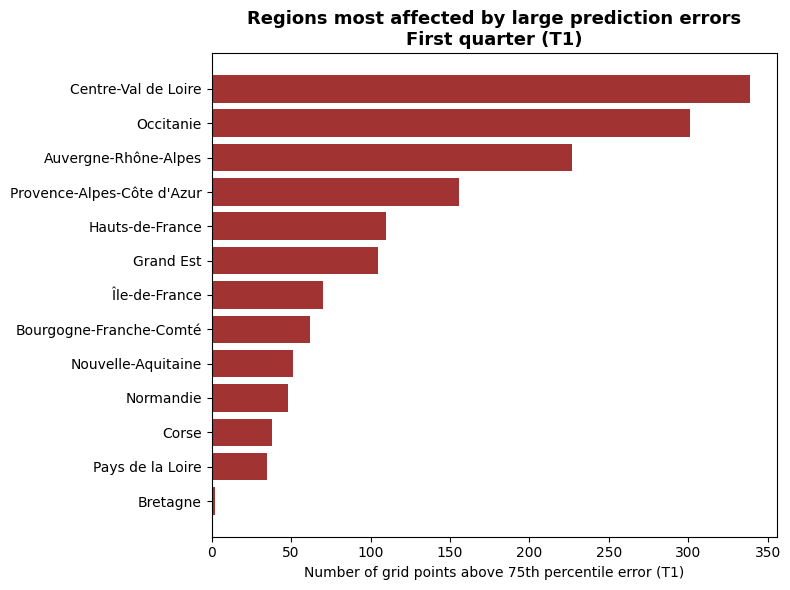

In [15]:
region_counts_T1 = (
    gdf_T1_high["region_name"]
    .value_counts()
    .sort_values(ascending=True)  # important pour barh
)

import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))

plt.barh(
    region_counts_T1.index,
    region_counts_T1.values,
    color="#8b0000",
    alpha=0.8
)

plt.xlabel("Number of grid points above 75th percentile error (T1)")
plt.title(
    "Regions most affected by large prediction errors\nFirst quarter (T1)",
    fontsize=13,
    weight="bold"
)

plt.tight_layout()
plt.show()


In [16]:
# T2
gdf_T2 = gdf_quarter[gdf_quarter['quarter'] == 'T2']
gdf_T2.explore(
    column='error_mean',
    cmap='Reds',
    legend=True,
    tooltip=['error_mean'],
    marker_kwds={'radius': 2.5},
    popup_on_click=True
)



In [17]:
q75_T2 = gdf_T2["error_mean"].quantile(0.75)
print("75th percentile (T2):", q75_T2)

gdf_T2_high = gdf_T2[gdf_T2["error_mean"] > q75_T2]

gdf_T2_high.explore(
    column="error_mean",
    cmap="Reds",
    legend=True,
    tooltip=["error_mean", "region_name"],
    marker_kwds={"radius": 2.5},
    popup_on_click=True
)


75th percentile (T2): 0.03465573807557424


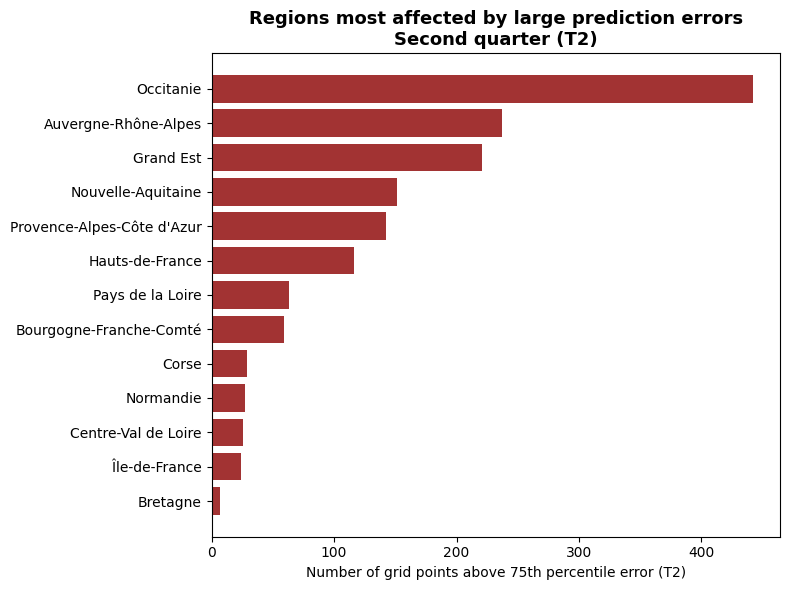

In [18]:
region_counts_T2 = (
    gdf_T2_high["region_name"]
    .value_counts()
    .sort_values(ascending=True)  # important pour barh
)

import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))

plt.barh(
    region_counts_T2.index,
    region_counts_T2.values,
    color="#8b0000",
    alpha=0.8
)

plt.xlabel("Number of grid points above 75th percentile error (T2)")
plt.title(
    "Regions most affected by large prediction errors\nSecond quarter (T2)",
    fontsize=13,
    weight="bold"
)

plt.tight_layout()
plt.show()


In [19]:
# T3
gdf_T3 = gdf_quarter[gdf_quarter['quarter'] == 'T3']
gdf_T3.explore(
    column='error_mean',
    cmap='Reds',
    legend=True,
    tooltip=['error_mean'],
    marker_kwds={'radius': 2.5},
    popup_on_click=True
)



In [20]:
q75_T3 = gdf_T3["error_mean"].quantile(0.75)
print("75th percentile (T3):", q75_T3)

gdf_T3_high = gdf_T3[gdf_T3["error_mean"] > q75_T3]

gdf_T3_high.explore(
    column="error_mean",
    cmap="Reds",
    legend=True,
    tooltip=["error_mean", "region_name"],
    marker_kwds={"radius": 2.5},
    popup_on_click=True
)


75th percentile (T3): 0.055135222434997556


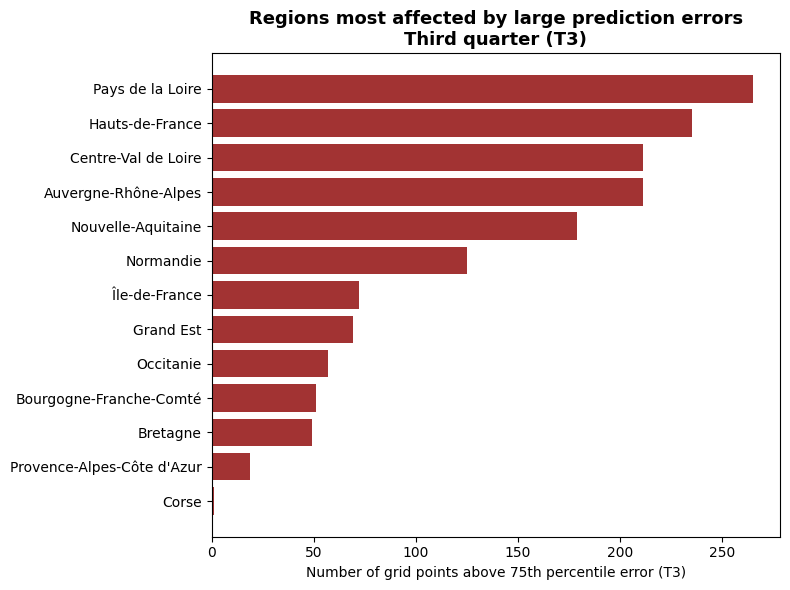

In [21]:
region_counts_T3 = (
    gdf_T3_high["region_name"]
    .value_counts()
    .sort_values(ascending=True)  # important pour barh
)

import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))

plt.barh(
    region_counts_T3.index,
    region_counts_T3.values,
    color="#8b0000",
    alpha=0.8
)

plt.xlabel("Number of grid points above 75th percentile error (T3)")
plt.title(
    "Regions most affected by large prediction errors\nThird quarter (T3)",
    fontsize=13,
    weight="bold"
)

plt.tight_layout()
plt.show()


In [22]:
# T4
gdf_T4 = gdf_quarter[gdf_quarter['quarter'] == 'T4']
gdf_T4.explore(
    column='error_mean',
    cmap='Reds',
    legend=True,
    tooltip=['error_mean'],
    marker_kwds={'radius': 2.5},
    popup_on_click=True
)

In [23]:
q75_T4 = gdf_T4["error_mean"].quantile(0.75)
print("75th percentile (T4):", q75_T4)

gdf_T4_high = gdf_T4[gdf_T4["error_mean"] > q75_T4]

gdf_T4_high.explore(
    column="error_mean",
    cmap="Reds",
    legend=True,
    tooltip=["error_mean", "region_name"],
    marker_kwds={"radius": 2.5},
    popup_on_click=True
)


75th percentile (T4): 0.07030017292499541


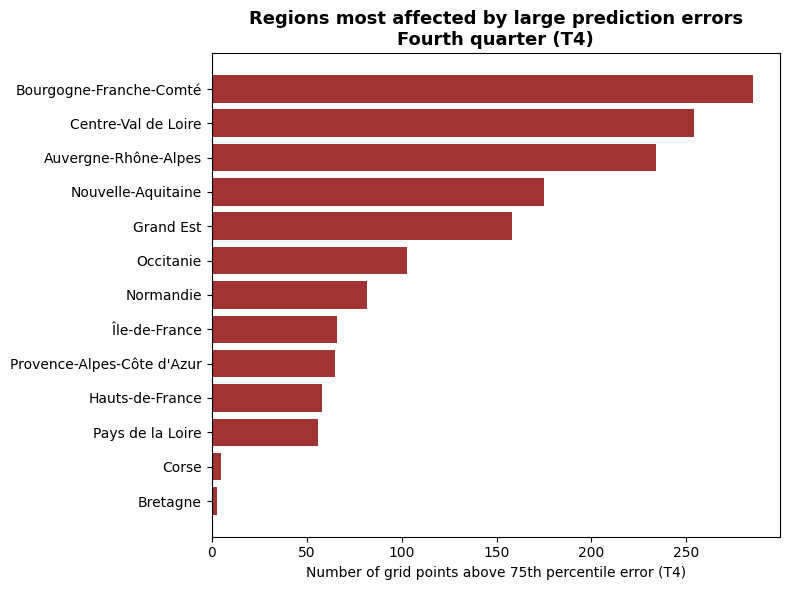

In [24]:
region_counts_T4 = (
    gdf_T4_high["region_name"]
    .value_counts()
    .sort_values(ascending=True)  # important pour barh
)

import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))

plt.barh(
    region_counts_T4.index,
    region_counts_T4.values,
    color="#8b0000",
    alpha=0.8
)

plt.xlabel("Number of grid points above 75th percentile error (T4)")
plt.title(
    "Regions most affected by large prediction errors\nFourth quarter (T4)",
    fontsize=13,
    weight="bold"
)

plt.tight_layout()
plt.show()


Le SWI (Soil Wetness Index) calculé par le réseau SAFRAN est un indicateur local de l’humidité des sols, qui reflète les conditions météorologiques et hydrologiques propres à chaque territoire. Le SWI Uniforme correspond à une version standardisée de ce même indicateur, pensée pour permettre une lecture cohérente et homogène de la sécheresse à l’échelle nationale, notamment dans le cadre réglementaire et des dispositifs CatNat. Dans ce contexte, le modèle que nous avons développé ne vise pas à recalculer le SWI Uniforme officiel, mais à approcher ses valeurs à partir des données locales disponibles, incluant le SWI SAFRAN, la composition des sols et les covariables géographiques. L’objectif principal n’est donc pas de remplacer le SWI Uniforme, mais de comprendre comment les variations locales influencent sa standardisation et d’identifier, via l’analyse des erreurs de prédiction, les zones où la divergence entre le SWI local et l’indicateur uniforme est la plus marquée.

Des erreurs faibles et uniformes indiquent que le processus de standardisation fonctionne de manière homogène, tandis que des erreurs spatialement différenciées révèlent des effets locaux, par exemple dus à l’hétérogénéité des sols ou à des conditions climatiques particulières. Cette approche permet ainsi de mettre en évidence les territoires où l’indicateur officiel pourrait ne pas refléter pleinement les conditions locales, offrant un support pour interpréter les décisions de reconnaissance de sécheresse et l’éligibilité CatNat.




### Analyse des erreurs temporelles et spatiales du modèle

L’examen des erreurs de prédiction sur l’année 2024 montre d’abord des différences intertemporelles marquées. La trajectoire temporelle des erreurs révèle un minimum autour du mois de mars, puis une progression constante jusqu’à la fin de l’année, suggérant que le modèle est globalement plus précis au printemps et moins performant à la fin de l’année.

Du point de vue spatial, le mapping des erreurs par trimestre met en évidence une homogénéité générale sur la majorité du territoire, mais chaque trimestre révèle systématiquement un petit ensemble de zones où l’erreur est plus élevée. Les régions concernées changent légèrement selon les trimestres, bien que certaines apparaissent de façon récurrente. Par exemple :  

- **T1 (premier trimestre)** : les régions les plus critiques sont Occitanie, Centre Val de Loire, suivies par Auvergne Rhône Alpes et Provence Alpes Côte d’Azur.  
- **T2 (deuxième trimestre)** : les zones les plus touchées se déplacent vers Occitanie et Grand Est, avec Auvergne Rhône Alpes et Provence Alpes Côte d’Azur encore présentes.  
- **T3 (troisième trimestre)** : Hauts-de-France et Pays de la Loire deviennent les régions prioritaires, avec Auvergne Rhône Alpes et Nouvelle Aquitaine en soutien.  
- **T4 (quatrième trimestre)** : Bourgogne Franche Comté et Nouvelle Aquitaine présentent les erreurs les plus importantes, suivies par Auvergne Rhône Alpes et Centre Val de Loire.  

Cette dynamique indique que, même si certaines régions montrent systématiquement des erreurs plus élevées, la priorité relative change selon la période de l’année, reflétant probablement l’effet combiné des conditions climatiques et de l’hétérogénéité locale des sols. Ces observations permettent de mettre en évidence les zones nécessitant une attention particulière pour la validation du modèle ou pour des décisions liées aux catastrophes naturelles (CatNat), tout en illustrant la variabilité spatiale et temporelle de la précision du SWI Uniforme.

Ces observations des erreurs spatiales et temporelles constituent la base pour discuter des implications politiques et de l’anticipation des catastrophes naturelles (CatNat).

### Policy Implications: Fairness and Bias

L'analyse des erreurs de prédiction du modèle SWI uniforme met en évidence des différences spatiales significatives qui ont des implications directes pour la politique de déclaration des sécheresses.

1. Équité des déclarations de sécheresse  
   Les écarts entre SWI observé et SWI uniforme révèlent que certaines régions sont systématiquement plus difficiles à prédire. Par exemple :  
   - T1 : Occitanie, Centre Val de Loire et Auvergne Rhône Alpes montrent les erreurs les plus élevées.  
   - T2 : Occitanie et Grand Est dominent, suivies par Auvergne Rhône Alpes.  
   - T3 : Hauts-de-France et Pays de la Loire sont les plus critiques.  
   - T4 : Bourgogne Franche Comté et Nouvelle Aquitaine affichent les écarts les plus importants.  

   Cela signifie que si les décisions de sécheresse se basent uniquement sur un SWI uniforme, certaines régions pourraient être sous-évaluées ou sur-évaluées par rapport à la réalité locale. Des politiques uniformes risquent donc d’être injustes pour certaines populations agricoles.

2. Biais lié à l’hétérogénéité du sol et des conditions locales  
   L’existence de zones avec des erreurs élevées suggère que des facteurs locaux non capturés par le SWI global influencent le stress hydrique. Ces facteurs peuvent inclure la texture du sol, la couverture végétale, l’exposition au soleil ou la topographie.  
   Ignorer ces différences peut introduire un biais dans les déclarations de sécheresse, pénalisant certaines régions plus que d’autres et rendant les interventions moins efficaces.

3. Conséquences pratiques  
   - Les autorités peuvent utiliser ces résultats pour adapter les seuils de déclenchement de sécheresse selon les régions, ou appliquer des mesures complémentaires dans les zones identifiées comme critiques.  
   - Cela permettrait une allocation plus équitable des aides et indemnisations, en tenant compte des variations locales plutôt que de s’appuyer sur un seuil uniforme.  
   - Enfin, la connaissance des zones systématiquement sujettes à des écarts importants peut guider les campagnes de mesure et de surveillance ciblées, afin de réduire les incertitudes et améliorer la précision des déclarations.

En résumé, le modèle met en lumière des disparités régionales importantes, ce qui souligne la nécessité d’une approche adaptée et différenciée pour les politiques de sécheresse, afin de garantir équité et fiabilité.


### Implications for CatNat Eligibility

Le modèle prédictif du SWI uniforme permet de mieux comprendre où et quand le stress hydrique atteint des niveaux critiques, ce qui est directement pertinent pour l’éligibilité aux catastrophes naturelles (CatNat) liées aux sécheresses.

1. Identification des zones à risque élevé  
   En analysant les erreurs de prédiction et les zones où le SWI uniforme diverge le plus du SWI observé, on peut identifier les régions où le risque de sécheresse est systématiquement sous-estimé ou surestimé :  
   - T1 (Jan-Mar) : Occitanie, Centre Val de Loire et Auvergne Rhône Alpes sont les plus critiques.  
   - T2 (Avr-Jun) : Occitanie et Grand Est concentrent les écarts les plus importants.  
   - T3 (Jul-Sep) : Hauts-de-France et Pays de la Loire montrent des erreurs marquées.  
   - T4 (Oct-Dec) : Bourgogne Franche Comté et Nouvelle Aquitaine présentent les écarts les plus élevés.  

   Ces informations permettent d’anticiper quelles régions pourraient dépasser les seuils de CatNat, même avant la déclaration officielle, en tenant compte des variations trimestrielles.

2. Amélioration de la précision des déclarations  
   Le modèle fournit un indicateur régionalisé du stress hydrique en intégrant les facteurs climatiques et pédologiques locaux. Ainsi :  
   - Les régions présentant des écarts élevés peuvent être surveillées de manière prioritaire.  
   - Les seuils d’alerte pour CatNat peuvent être ajustés localement, évitant des déclarations uniformes qui pourraient être injustes pour certaines zones.

3. Support à la prise de décision proactive  
   - Les autorités peuvent utiliser ces prédictions pour planifier des interventions ciblées, telles que la distribution d’eau, le soutien agricole ou des mesures de mitigation avant que les dégâts ne deviennent critiques.  
   - Le modèle aide également à justifier les décisions de reconnaissance CatNat auprès des parties prenantes, en fournissant des preuves basées sur des données et des analyses régionales plutôt que sur des seuils globaux.

En résumé, le modèle sert non seulement à identifier les régions les plus vulnérables au stress hydrique, mais aussi à améliorer la justice et la réactivité des déclarations CatNat, en adaptant les décisions aux conditions locales et temporelles observées.
